<a href="https://colab.research.google.com/github/Aamir195/Music-Genre-classification/blob/main/MusicGenre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Some Basic Things

In [ ]:
# Importing neccesary libraries
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
## conecring with google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#path for some audio files (example)

blue = "drive/MyDrive/Music_Genre_Classification/Data/genres_original/fold0/blues.00000.wav"
classical = "drive/MyDrive/Music_Genre_Classification/Data/genres_original/fold1/classical.00000.wav"
disco = "drive/MyDrive/Music_Genre_Classification/Data/genres_original/fold3/disco.00000.wav"

In [ ]:
# playing audio files
ipd.Audio(disco)

In [ ]:
# playing audio files
ipd.Audio(classical)

In [ ]:
# playing audio files
ipd.Audio(blue)

The sampling rate refers to the number of samples of audio recorded every second. It is measured in samples per second or Hertz (abbreviated as Hz or kHz, with one kHz being 1000 Hz).

In [ ]:
blue, sr = librosa.load(blue, mono=True)
classical,sr1= librosa.load(classical, mono=True)   # classical = data(sudion in array formate ) , sr (sample rate)
disco, sr2 = librosa.load(disco, mono=True)

In [ ]:
blue, classical, disco     ## sound converted into array

(array([ 0.00732422,  0.01660156,  0.00762939, ..., -0.05560303,
        -0.06106567, -0.06417847], dtype=float32),
 array([-0.02008057, -0.01748657,  0.00418091, ...,  0.01934814,
         0.027771  ,  0.03131104], dtype=float32),
 array([-0.23202515, -0.23168945, -0.1979065 , ..., -0.17419434,
        -0.14257812, -0.10617065], dtype=float32))

In [ ]:
# duration of one sample
sample_duration = 1/sr
print(f"Duration of one sample is: {sample_duration: .6f} seconds")

Duration of one sample is:  0.000045 seconds


In [ ]:
# duration of audio signal in second
duration = sample_duration*len(blue)
print(f"duration of signal is : {duration: .2f} seconds")

duration of signal is :  30.01 seconds


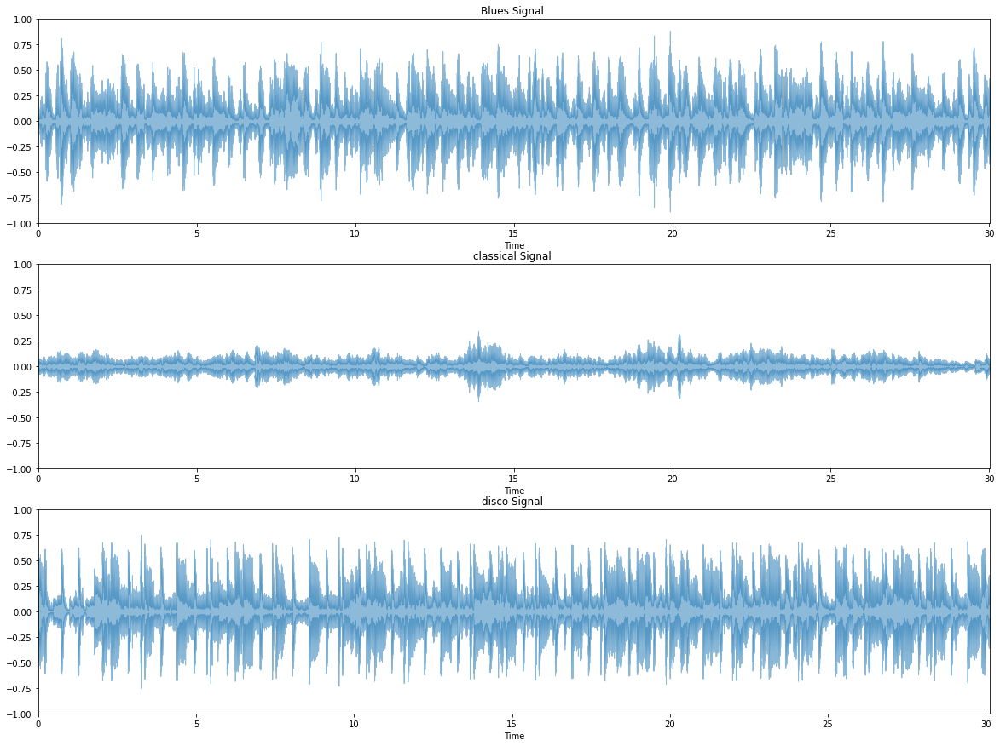

In [ ]:
# visulaize the waveform
plt.figure(figsize=(20, 15))

plt.subplot(3, 1, 1)
librosa.display.waveplot(blue , alpha= 0.5)
plt.title("Blues Signal ")
plt.ylim((-1, 1))

plt.subplot(3, 1, 2)
librosa.display.waveplot(classical, alpha= 0.5)
plt.title("classical Signal ")
plt.ylim((-1, 1))

plt.subplot(3, 1, 3)
librosa.display.waveplot(disco, alpha= 0.5)
plt.title("disco Signal ")
plt.ylim((-1, 1))

plt.show()

## Visulaizing audio


### Spectrogram
* A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams
* Spectrum : the representation of sound in terms of its frequency composition.

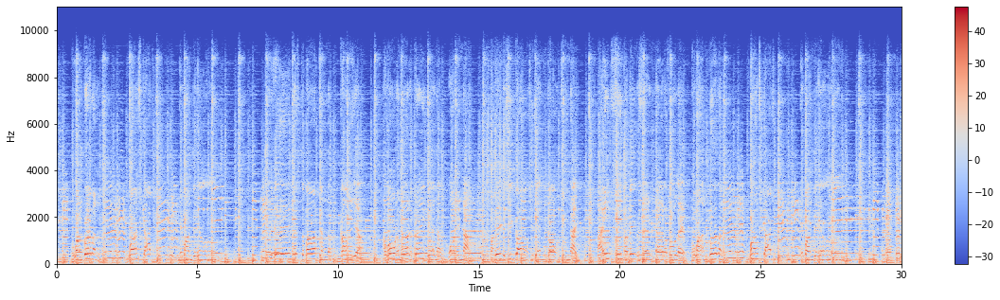

In [ ]:
# spectrogram for blues type audio file

X1 = librosa.stft(blue)    ## blue : - data from audio file
Xdb = librosa.amplitude_to_db(abs(X1))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

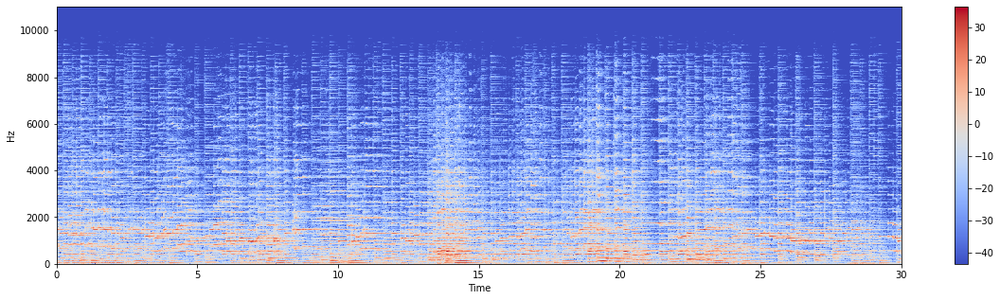

In [ ]:
# spectrogram for classical type audio file

X2 = librosa.stft(classical)    ## classical : - data from audio file
Xdb = librosa.amplitude_to_db(abs(X2))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

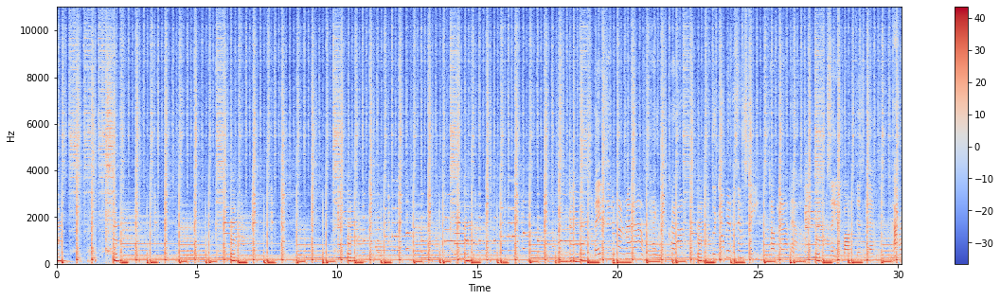

In [ ]:
# spectrogram for disco type audio file

X3 = librosa.stft(disco)    ## disco : - data from disco audio file
Xdb = librosa.amplitude_to_db(abs(X3))
plt.figure(figsize=(20, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

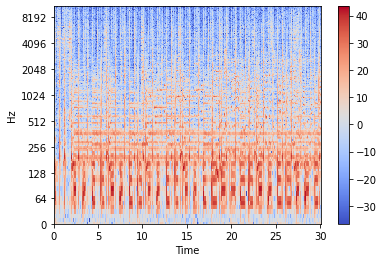

In [ ]:
## Log Frequency axis (sine charts that increase logarithmically in spatial frequency.)

librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

## Feature Extaction
* Getting useful information from Given audio files
* In our data set we have csv file in which all the featues is given, so we are just demonstrating the how all feaures is calculated from audio files.

### Amplitude Envelope
* Amplitude envelope refers to the changes in the amplitude of a sound over time, and is an influential property as it affects our perception of timbre.

* This is an important property of sound, because it is what allows us to effortlessly identify sounds, and uniquely distinguish them from other sounds.




In [ ]:
# Amplitude envelope (highest amplitude in particular sample)

FRAME_SIZE =1024
HOPE_LENGTH = 512

# fancy way to calculate the Amplitude Envelope
def fancy_amplitude_envelope(signal, frame_size, hope_length ):
  return np.array([max(signal[i : hope_length+i]) for i in range(0, signal.size, hope_length)])

In [ ]:
ae_blues = fancy_amplitude_envelope(blue, FRAME_SIZE, HOPE_LENGTH)
len(ae_blues)    # size of amplitude envelope

1293

In [ ]:
ae_classical = fancy_amplitude_envelope(blue, FRAME_SIZE, HOPE_LENGTH)
len(ae_classical)

1293

In [ ]:
ae_disco = fancy_amplitude_envelope(blue, FRAME_SIZE, HOPE_LENGTH)
len(ae_disco)

1293

In [ ]:
frame = range(0, ae_blues.size)
t = librosa.frames_to_time(frame, hop_length=HOPE_LENGTH)   # time

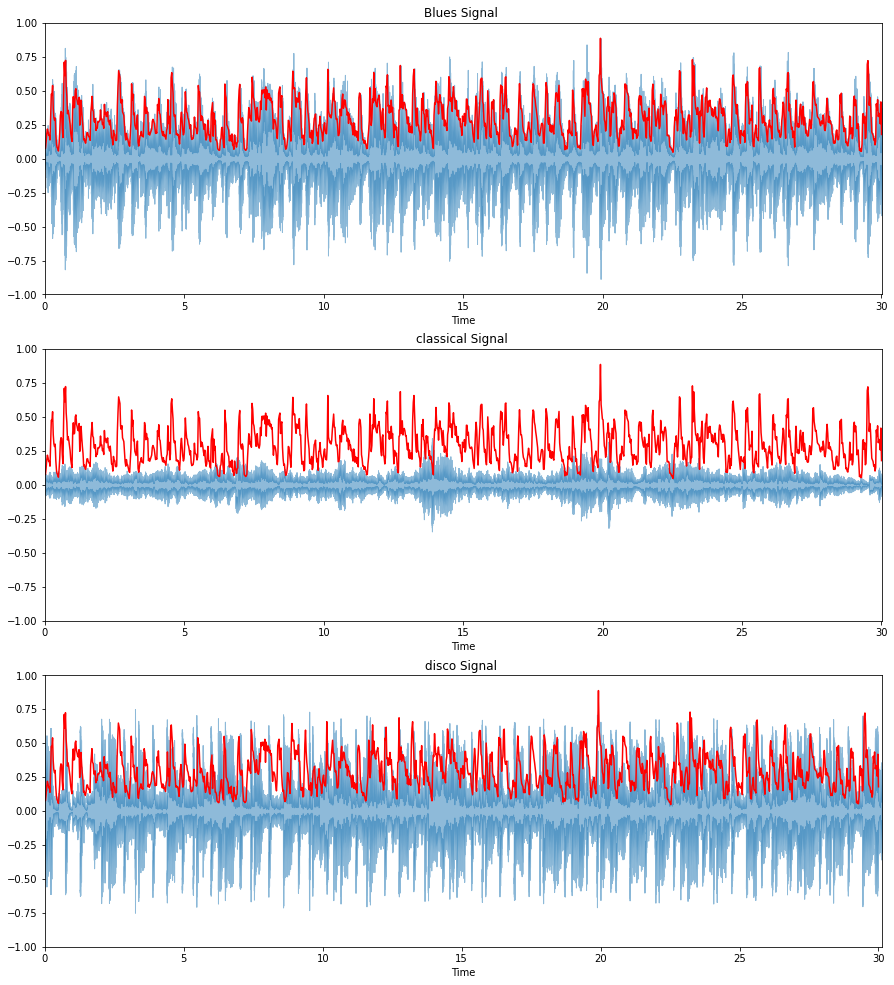

In [ ]:
# visualize the amplitude envelope for all audio files
plt.figure(figsize=(15, 17))

plt.subplot(3, 1, 1)
librosa.display.waveplot(blue , alpha= 0.5)
plt.plot(t, ae_blues, color="red")
plt.title("Blues Signal ")
plt.ylim((-1, 1))

plt.subplot(3, 1, 2)
librosa.display.waveplot(classical, alpha= 0.5)
plt.plot(t, ae_classical, color="red")
plt.title("classical Signal ")
plt.ylim((-1, 1))

plt.subplot(3, 1, 3)
librosa.display.waveplot(disco, alpha= 0.5)
plt.plot(t, ae_disco, color="red")
plt.title("disco Signal ")
plt.ylim((-1, 1))

plt.show()

### **Zero-crossing rate**
1. The zero-crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to zero to negative or from negative to zero to positive.

2. Zero-crossing rate is a measure of number of times in a given time interval/frame that the amplitude of the speech signals passes through a value of zero.






In [ ]:
#Zero-crossing rate with Librosa
zcr_blue = librosa.feature.zero_crossing_rate(blue, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]
zcr_classical = librosa.feature.zero_crossing_rate(classical, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]
zcr_disco = librosa.feature.zero_crossing_rate(disco, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]

In [ ]:
frame = range(len(zcr_blue))
t = librosa.frames_to_time(frame, hop_length=HOPE_LENGTH)

frame = range(len(zcr_disco))
t1 = librosa.frames_to_time(frame, hop_length=HOPE_LENGTH)


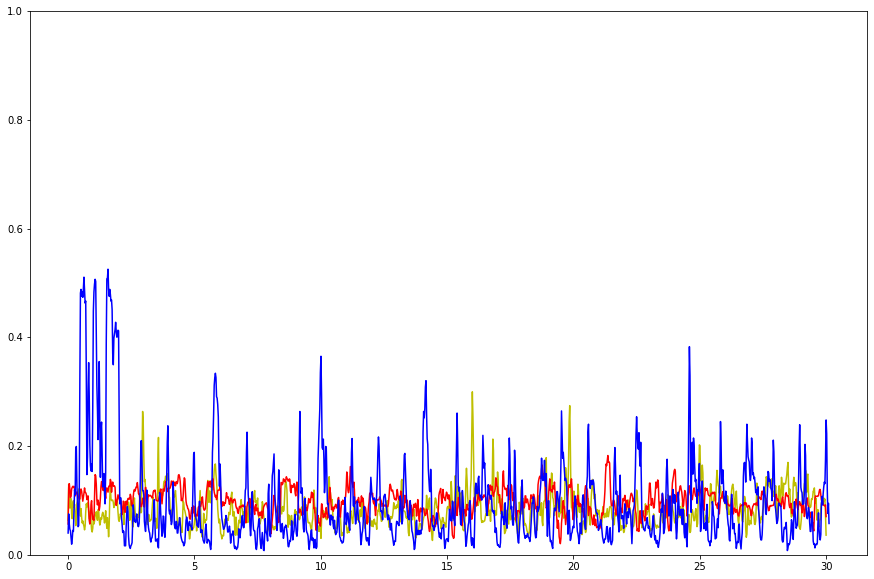

In [ ]:
#Visualise zero-crossing rate with Librosa


plt.figure(figsize=(15, 10))

plt.plot(t, zcr_blue, color="y")
plt.plot(t, zcr_classical, color="r")
plt.plot(t1, zcr_disco, color="b")
plt.ylim(0, 1)
plt.show()

### RMS Energy
* is the square root of the average of the square of the energy of the sound signal over a given duration.

In [ ]:
FRAME_SIZE = 1024
HOPE_LENGTH = 512
# Root-mean-squared energy with Librosa

rms_blue = librosa.feature.rms(blue, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]
rms_classical = librosa.feature.rms(classical, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]
rms_disco = librosa.feature.rms(disco, frame_length=FRAME_SIZE, hop_length=HOPE_LENGTH)[0]

In [ ]:
rms_blue.shape

(1293,)

In [ ]:
frame = range(len(rms_blue))
t = librosa.frames_to_time(frame, hop_length=HOPE_LENGTH)   # time

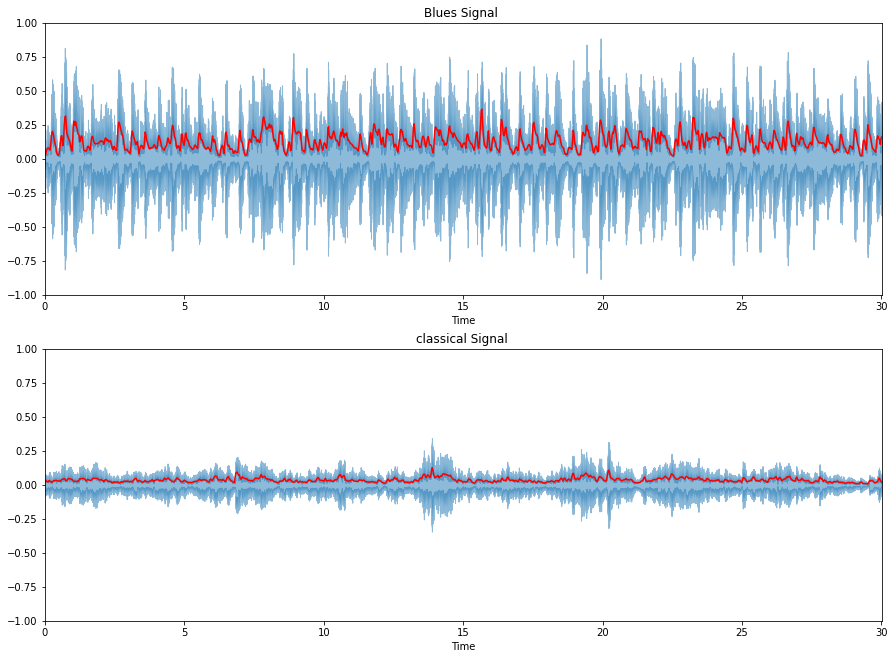

In [ ]:
# visualize the RMSE for all audio files

plt.figure(figsize=(15, 17))

plt.subplot(3, 1, 1)
librosa.display.waveplot(blue , alpha= 0.5)
plt.plot(t, rms_blue, color="red")
plt.title("Blues Signal ")
plt.ylim((-1, 1))

plt.subplot(3, 1, 2)
librosa.display.waveplot(classical, alpha= 0.5)
plt.plot(t, rms_classical, color="red")
plt.title("classical Signal ")
plt.ylim((-1, 1))


plt.show()

In [ ]:
#RMSE from scratch
def rmse(signal, frame_size, hop_length):
    rmse = []

    # calculate rmse for each frame
    for i in range(0, len(signal), hop_length):
        rmse_current_frame = np.sqrt(sum(signal[i:i+frame_size]**2) / frame_size)
        rmse.append(rmse_current_frame)
    return np.array(rmse)

In [ ]:

HOPE_LENGTH = 512
rms_blue1 = rmse(blue, FRAME_SIZE, HOPE_LENGTH)
rms_classical1 = rmse(classical, FRAME_SIZE, HOPE_LENGTH)
rms_disco1 = rmse(disco, FRAME_SIZE, HOPE_LENGTH)

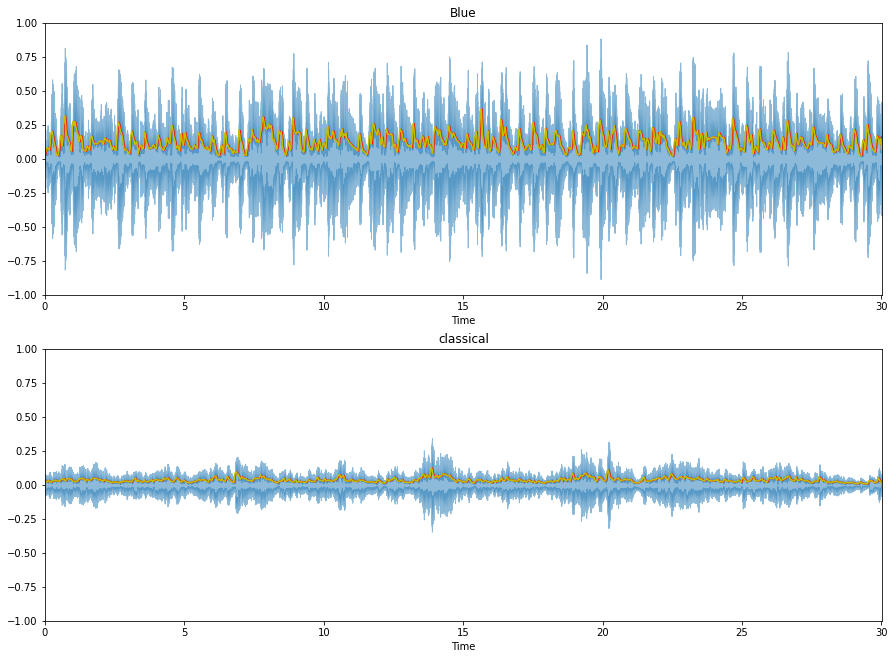

In [ ]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(blue, alpha=0.5)
plt.plot(t, rms_blue, color="r")
plt.plot(t, rms_blue1, color="y")
plt.ylim((-1, 1))
plt.title("Blue")

plt.subplot(3, 1, 2)
librosa.display.waveplot(classical, alpha=0.5)
plt.plot(t, rms_classical, color="r")
plt.plot(t, rms_classical1, color="y")
plt.ylim((-1, 1))
plt.title("classical")



plt.show()

### Spectral centroid with Librosa

* The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the center of mass of the spectrum is located. Perceptually, it has a robust connection with the impression of brightness of a sound.

* An **audio frame, or sample**, contains amplitude (loudness) information at that particular point in time. To produce sound, tens of thousands of frames are played in sequence to produce frequencies.

* Hop length : The number of samples between successive frames, e.g., the columns of a spectrogram.


In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512


In [ ]:
sc_blue = librosa.feature.spectral_centroid(y=blue, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_classical = librosa.feature.spectral_centroid(y=classical, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
sc_disco = librosa.feature.spectral_centroid(y=disco, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
sc_blue.shape

(1293,)

In [ ]:
#Visualising spectral centroid
frames = range(len(sc_classical))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

frame1 = range(len(sc_disco))
t2 = librosa.frames_to_time(frame1, hop_length=HOP_LENGTH)


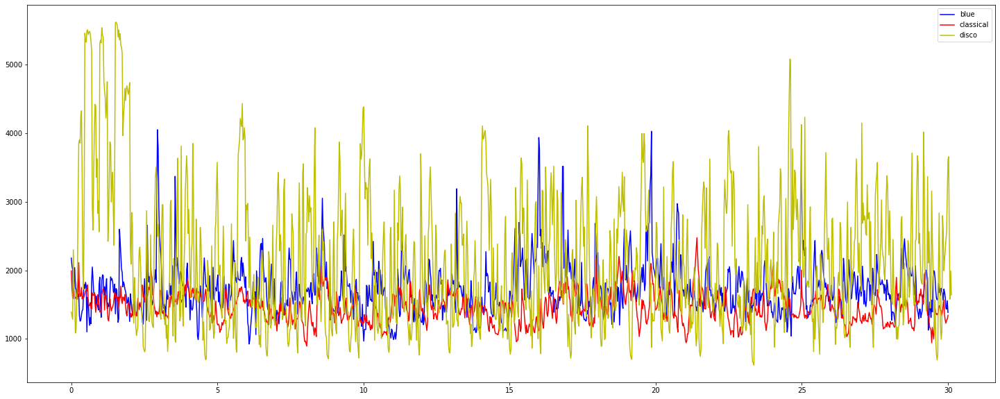

In [ ]:
plt.figure(figsize=(25,10))

plt.plot(t, sc_blue, color='b')
plt.plot(t, sc_classical, color='r')
plt.plot(t1, sc_disco, color='y')

plt.legend(["blue", "classical", "disco"])
plt.show()

### Spectral bandwidth with Librosa

* The spectral bandwidth or spectral spread is derived from the spectral centroid. It is the spectral range of interest around the centroid, that is, the variance from the spectral centroid.

In [ ]:
ban_blue = librosa.feature.spectral_bandwidth(y=blue, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
ban_classical = librosa.feature.spectral_bandwidth(y=classical, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
ban_disco = librosa.feature.spectral_bandwidth(y=disco, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

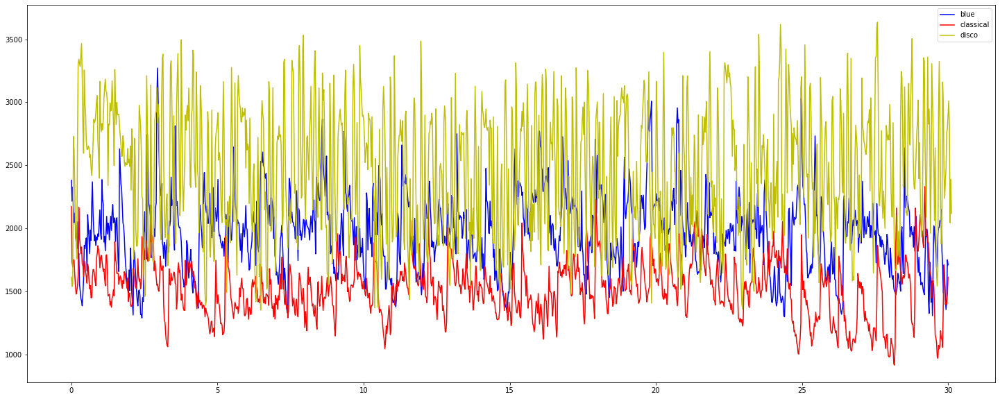

In [ ]:
#Visualising spectral bandwidth

plt.figure(figsize=(25,10))

plt.plot(t, ban_blue, color='b')
plt.plot(t, ban_classical, color='r')
plt.plot(t1, ban_disco, color='y')
plt.legend(["blue", "classical", "disco"])

plt.show()

### Calculate Band Energy Ratio

* The Band Energy Ratio (BER) provides the relation between the lower and higher frequency bands. It can be thought of as the measure of how dominant low frequencies are.

In [ ]:
# Extract spectrograms

FRAME_SIZE = 2048
HOP_SIZE = 512

blue_spec = librosa.stft(blue, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
classical_spec = librosa.stft(classical, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
disco_spec = librosa.stft(disco, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [ ]:
blue_spec.shape

(1025, 1293)

In [ ]:
import math

In [ ]:
def calculate_split_frequency_bin(split_frequency, sample_rate, num_frequency_bins):
    """Infer the frequency bin associated to a given split frequency."""

    frequency_range = sample_rate / 2
    frequency_delta_per_bin = frequency_range / num_frequency_bins
    split_frequency_bin = math.floor(split_frequency / frequency_delta_per_bin)
    return int(split_frequency_bin)

In [ ]:
split_frequency_bin = calculate_split_frequency_bin(2000, 22050, 1025)
split_frequency_bin

185

In [ ]:
def band_energy_ratio(spectrogram, split_frequency, sample_rate):
    """Calculate band energy ratio with a given split frequency."""

    split_frequency_bin = calculate_split_frequency_bin(split_frequency, sample_rate, len(spectrogram[0]))
    band_energy_ratio = []

    # calculate power spectrogram
    power_spectrogram = np.abs(spectrogram) ** 2
    power_spectrogram = power_spectrogram.T

    # calculate BER value for each frame
    for frame in power_spectrogram:
        sum_power_low_frequencies = frame[:split_frequency_bin].sum()
        sum_power_high_frequencies = frame[split_frequency_bin:].sum()
        band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(band_energy_ratio_current_frame)

    return np.array(band_energy_ratio)

In [ ]:
ber_blue = band_energy_ratio(blue_spec, 2000, sr)
ber_classical = band_energy_ratio(classical_spec, 2000, sr)
ber_disco = band_energy_ratio(disco_spec, 2000, sr)

In [ ]:
ber_blue.shape

(1293,)

In [ ]:
frames = range(len(ber_blue))
t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)

frames = range(len(ber_disco))
t1 = librosa.frames_to_time(frames, hop_length=HOP_SIZE)

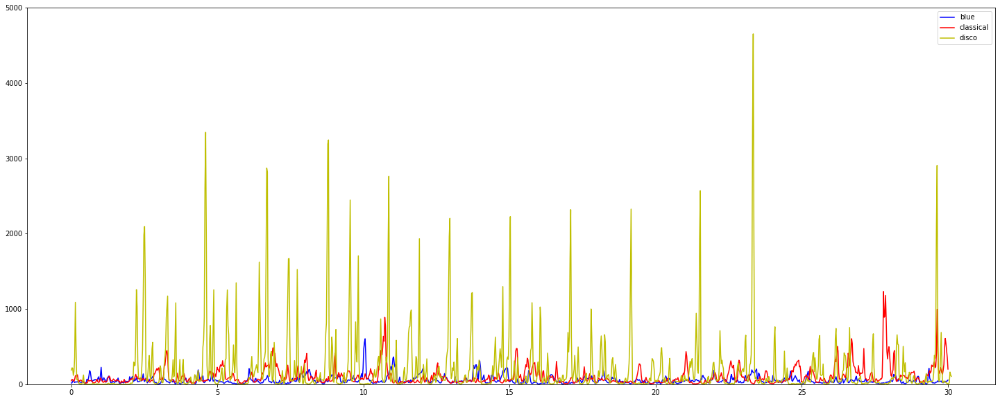

In [ ]:
#Visualise Band Energy Ratio

plt.figure(figsize=(25, 10))

plt.plot(t, ber_blue, color="b")
plt.plot(t, ber_classical, color="r")
plt.plot(t1, ber_disco, color="y")
plt.ylim((0, 5000))

plt.legend(["blue","classical","disco"])
plt.show()

## About the Dataset

* GTZAN datset contain two csv files (feature_30.csv and feature_3.csv), Images file (mffc), and original auduio files.

* In  the dataset we have a many features and some of the features is extracted here (as shown above).

* Now , we will see some information about our dataset.


In [ ]:
df = pd.read_csv("drive/MyDrive/Music_Genre_Classification/Data/features_30_sec.csv")
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
df.shape      # 1000 rows and 60 columns

(1000, 60)

In [ ]:
df.describe()   ## short description of dataset

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,662030.846000,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165,4571.549304,1.844345e+06,0.103612,0.002986,-3.659332e-04,0.012540,-0.000395,5.670073e-03,119.505363,-144.472987,3747.875414,99.554278,706.899539,-8.920291,468.286436,36.292447,220.447219,-1.144840,174.404462,14.633491,127.232071,-5.129038,116.367019,10.119172,88.198988,-6.994062,88.566933,7.729785,81.733490,-6.021069,75.551228,4.471693,68.670817,-4.795884,67.871712,1.781900,64.764096,-3.869308,62.873761,1.148144,60.730958,-3.966028,62.633624,0.507696,63.712586,-2.328761,66.231930,-1.095348,70.126096
std,1784.073992,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326,1574.791602,1.425085e+06,0.041821,0.003024,1.683946e-03,0.011653,0.001082,6.500325e-03,28.264176,100.229406,2770.558394,31.330873,439.120256,21.690676,287.143462,16.664665,116.236941,12.221340,100.767823,11.839591,68.475115,9.940460,58.400048,10.463270,41.048213,8.283921,39.494072,7.937309,36.733649,6.817013,38.135183,6.715787,32.625534,6.170181,33.154276,5.008385,34.450290,4.873599,33.904101,4.578948,33.781951,4.549697,33.479172,3.869105,34.401977,3.755957,37.174631,3.837007,45.228512
min,660000.000000,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,1.468612e+04,0.021697,0.000044,-2.606458e-02,0.000049,-0.007150,8.299008e-07,54.978391,-552.120056,174.571365,-1.461542,93.104752,-89.870193,35.467754,-18.727547,34.263149,-38.890347,29.912008,-28.415911,20.847921,-32.930431,29.027332,-24.915823,22.464230,-31.640574,25.825863,-12.050177,19.273201,-28.057501,21.402756,-15.796446,18.642517,-27.523129,17.293922,-12.594489,14.250607,-17.539125,9.769691,-15.693844,9.169314,-17.234728,13.931521,-11.963694,15.420555,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428,3380.069642,7.727312e+05,0.070244,0.001079,-1.041584e-04,0.004383,-0.000537,1.292592e-03,99.384014,-200.763893,1844.488129,76.779915,398.020767,-24.219811,270.466576,24.108212,129.397377,-9.979157,101.266209,5.098573,76.505194,-12.870810,73.546917,1.609181,57.349041,-13.246939,59.882313,1.620753,55.734016,-10.964135,51.242420,-0.547371,46.854038,-9.357906,46.294396,-1.639417,43.416593,-7.165884,42.236251,-1.863280,40.376442,-7.207225,40.830875,-2.007015,41.884240,-4.662925,41.710184,-3.368996,42.372865
50%,661794.000000,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036,4658.524473,1.476115e+06,0.099503,0

In [ ]:
df.columns    ## name of columns

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

In [ ]:
df["label"].value_counts()      # our dataset is balanced

blues        100
metal        100
rock         100
reggae       100
country      100
hiphop       100
pop          100
jazz         100
classical    100
disco        100
Name: label, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 1000 non-null   object 
 1   length                   1000 non-null   int64  
 2   chroma_stft_mean         1000 non-null   float64
 3   chroma_stft_var          1000 non-null   float64
 4   rms_mean                 1000 non-null   float64
 5   rms_var                  1000 non-null   float64
 6   spectral_centroid_mean   1000 non-null   float64
 7   spectral_centroid_var    1000 non-null   float64
 8   spectral_bandwidth_mean  1000 non-null   float64
 9   spectral_bandwidth_var   1000 non-null   float64
 10  rolloff_mean             1000 non-null   float64
 11  rolloff_var              1000 non-null   float64
 12  zero_crossing_rate_mean  1000 non-null   float64
 13  zero_crossing_rate_var   1000 non-null   float64
 14  harmony_mean             

In [ ]:
df.isnull().sum()     # there is no null values in dataset

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var     

In [ ]:
df.nunique()

filename                   1000
length                       35
chroma_stft_mean            986
chroma_stft_var             986
rms_mean                    986
rms_var                     986
spectral_centroid_mean      986
spectral_centroid_var       986
spectral_bandwidth_mean     986
spectral_bandwidth_var      986
rolloff_mean                986
rolloff_var                 986
zero_crossing_rate_mean     984
zero_crossing_rate_var      986
harmony_mean                986
harmony_var                 986
perceptr_mean               986
perceptr_var                986
tempo                        35
mfcc1_mean                  986
mfcc1_var                   986
mfcc2_mean                  986
mfcc2_var                   986
mfcc3_mean                  986
mfcc3_var                   986
mfcc4_mean                  986
mfcc4_var                   986
mfcc5_mean                  986
mfcc5_var                   986
mfcc6_mean                  986
mfcc6_var                   986
mfcc7_me

In [ ]:
import seaborn as sns

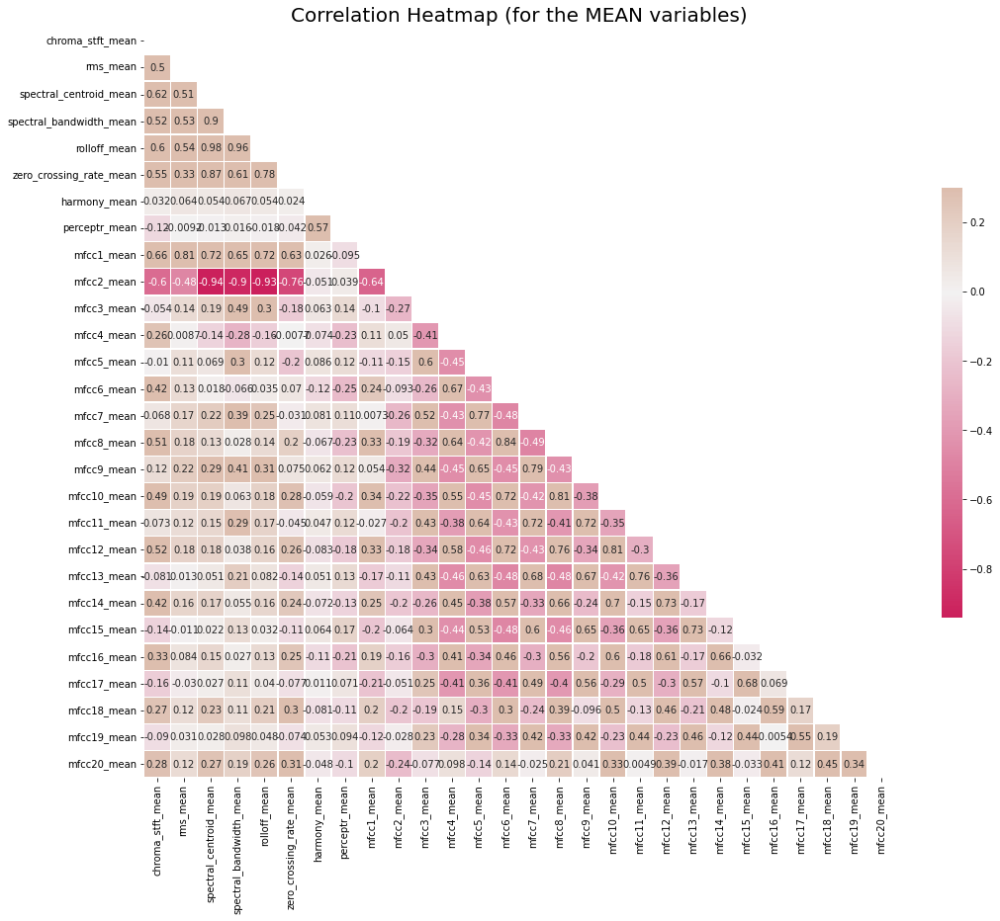

In [ ]:
#Correlation Heatmap for feature means
# Computing the Correlation Matrix
spike_cols = [col for col in df.columns if 'mean' in col]
corr = df[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(17, 16));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, annot=True, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

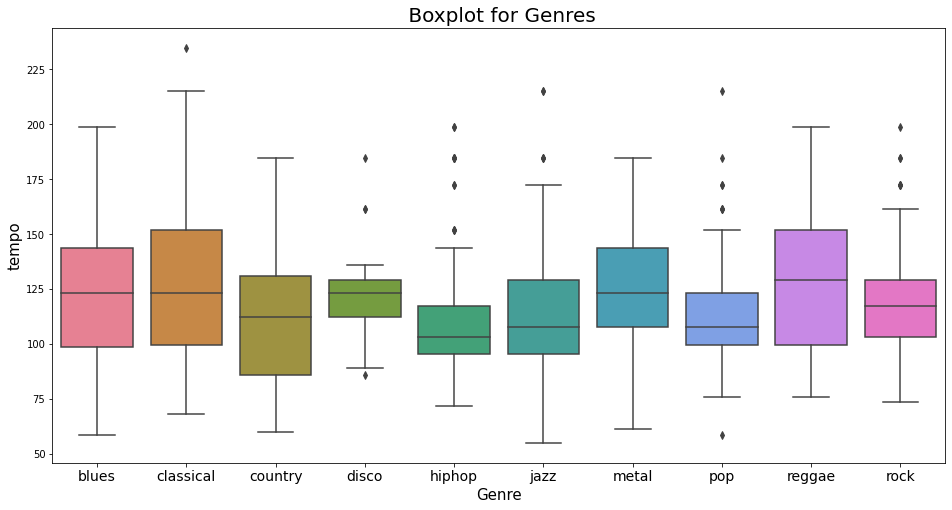

In [ ]:
#Box Plot for Genres Distributions
x = df[["label", "tempo"]]

fig, ax = plt.subplots(figsize=(16, 8));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title(' Boxplot for Genres', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("tempo", fontsize = 15)
plt.savefig("BPM_Boxplot.png")


### This show that for a particular genre speed of sound

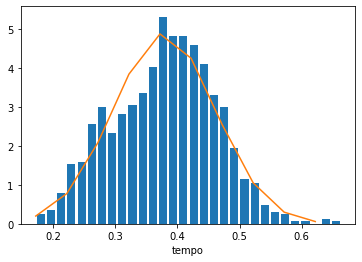

In [ ]:
from scipy.stats import norm

plt.hist(df["chroma_stft_mean"], bins=30, rwidth=0.8, density= True)
plt.xlabel("tempo")


rng = np.arange(df.chroma_stft_mean.min(), df.chroma_stft_mean.max(), 0.05)
plt.plot(rng, norm.pdf(rng, df.chroma_stft_mean.mean(), df.chroma_stft_mean.std()))




## Data Preprocessing

In [ ]:
# label encoding our "label" into numeric

from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])

In [ ]:
df.shape   ## shape of the dataset

(1000, 60)

In [ ]:
# creating feature and target dataset

X = df.drop(['label','filename'],axis=1)
y = df['label']

In [ ]:
X.shape    ## shape of the feature dataset

(1000, 58)

In [ ]:
X.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035
1,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282
2,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025
3,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339
4,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160


### Detecting Outlers and removing it using Mahalanobis Distance

https://towardsdatascience.com/multivariate-outlier-detection-in-python-e946cfc843b3

In [ ]:
from scipy.stats import chi2
from matplotlib import patches

In [ ]:
# Covariance matrix
covariance  = np.cov(X , rowvar=False)

# Covariance matrix power of -1
covariance_pm1 = np.linalg.matrix_power(covariance, -1)

# Center point
centerpoint = np.mean(X , axis=0)


In [ ]:
covariance_pm1 = np.around(covariance_pm1)

covariance_pm1 = covariance_pm1.astype(int)

In [ ]:
from scipy.spatial import distance

In [ ]:
# Distances between center point and
distances = []
for i, val in enumerate(X):
  if i <60:
    continue
  p1 = val
  p2 = centerpoint
  distance = distance.mahalanobis(p1, p2, covariance_pm1)
  # ((p1-p2).T.dot(covariance_pm1)).dot(p1-p2)
  distances.append(distance)


# distances = np.array(distances)

# Cutoff (threshold) value from Chi-Sqaure Distribution for detecting outliers
cutoff = chi2.ppf(0.95, X.shape[1])    # ppf: percent point function (or inverse cumulative distribution function) ppf
                                      #returns the value x of
                                        #the variable that has a given cumulative distribution probability (cdf).

# Index of outliers
outlierIndexes = np.where(distances > cutoff )

print('--- Index of Outliers ----')
print(outlierIndexes)

X= X.values

print('--- Observations found as outlier -----')
print(X[ distances < cutoff , :])

--- Index of Outliers ----
(array([], dtype=int64),)
--- Observations found as outlier -----
[]


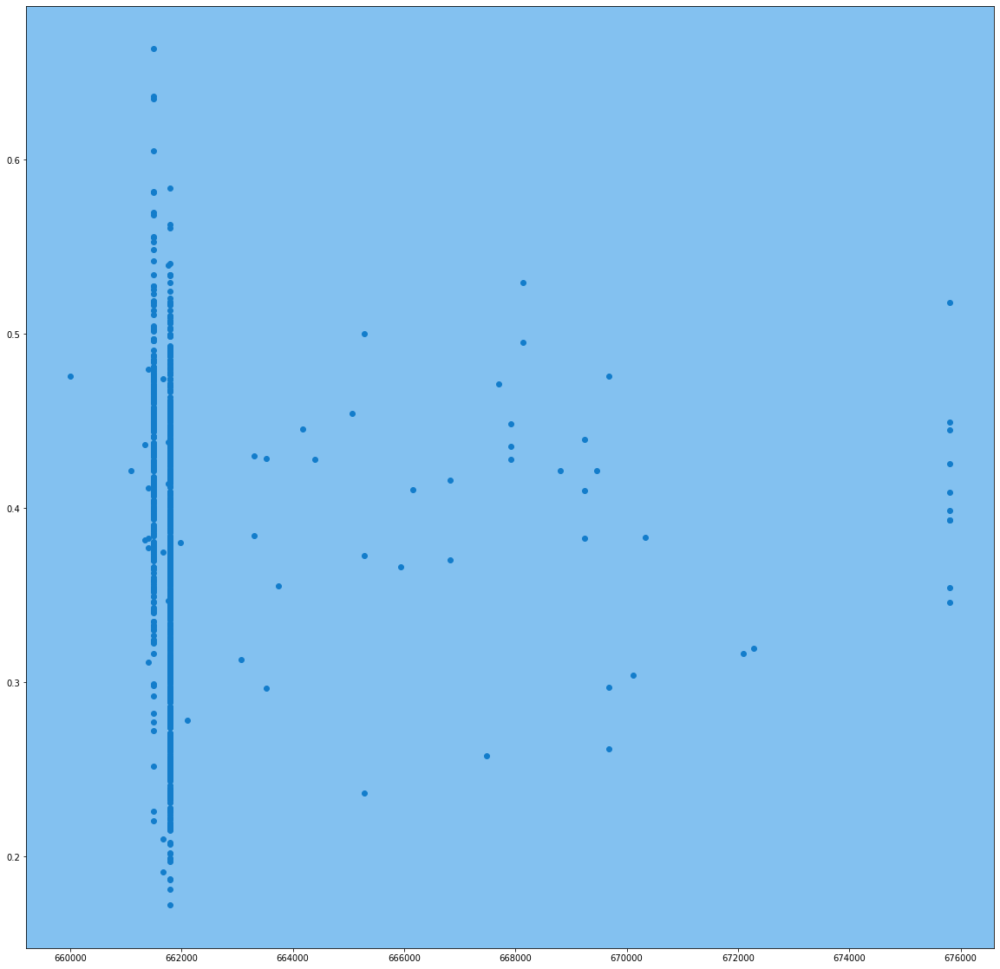

In [ ]:
## there is no outliers in our dataset


pearson = covariance[0, 1]/np.sqrt(covariance[0, 0] * covariance[1, 1])
ell_radius_x = np.sqrt(1 + pearson)
ell_radius_y = np.sqrt(1 - pearson)
lambda_, v = np.linalg.eig(covariance)
lambda_ = np.sqrt(lambda_)

# Ellipse patch
ellipse = patches.Ellipse(xy=(centerpoint[0], centerpoint[1]),
                  width=lambda_[0]*np.sqrt(cutoff)*2, height=lambda_[1]*np.sqrt(cutoff)*2,
                  angle=np.rad2deg(np.arccos(v[0, 0])), edgecolor='#fab1a0')
ellipse.set_facecolor('#0984e3')
ellipse.set_alpha(0.5)
fig = plt.figure(figsize=(20,20))
ax = plt.subplot()
ax.add_artist(ellipse)
plt.scatter(X[: , 0], X[ : , 1])
plt.show()

### Removing Multi-colinearity from the data set using Co-relation


In [ ]:
# library for spliting our data set

from sklearn.model_selection import train_test_split

In [ ]:
# creating feature and target dataset

X = df.drop(['label','filename'],axis=1)
y = df['label']

* This data will be used as a for our first analysis which is go through the normlization and then model building.  : Dataset-1
* Now the same data will be go through pca and then for model building : Dataset-2

In [ ]:
# Spiting our data set into test and train

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((800, 58), (200, 58), (800,), (200,))

In [ ]:
X_train_pca = X_train      ## copying data into another variable for applying pca on it
X_test_pca = X_test

In [ ]:
col = X_train.columns
col

Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var'],
      dtype='

In [ ]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train = norm.transform(X_train)

# transform testing data
X_test = norm.transform(X_test)

In [ ]:
#converting into dataframe
X_train = pd.DataFrame(X_train, columns=col)
X_test = pd.DataFrame(X_test, columns=col)


In [ ]:
X_train.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,8.000000e+02,800.000000,800.000000,800.000000,8.000000e+02,800.000000,800.000000,8.000000e+02,800.000000,800.000000,8.000000e+02,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,662023.477500,0.377409,0.086554,0.130986,0.003122,2198.952830,4.804732e+05,2243.448692,138632.896088,4569.601529,1.860952e+06,0.102969,0.003033,-3.790692e-04,0.012562,-0.000406,5.770814e-03,118.882044,-145.996116,3798.198448,99.999121,719.266634,-8.296091,469.719860,35.692251,221.910929,-0.871337,175.010260,14.092487,127.249251,-4.801669,115.448797,9.641117,88.518391,-6.693291,88.065709,7.335069,82.010337,-5.852508,76.207930,4.241891,68.973042,-4.523315,68.302867,1.585182,64.741224,-3.772540,62.539833,0.952650,59.768707,-3.868764,61.907967,0.381697,63.303904,-2.238589,66.147834,-1.076661,70.214028
std,1728.856429,0.081107,0.007463,0.066431,0.003769,730.552952,4.152754e+05,546.670132,97857.254353,1625.667070,1.441779e+06,0.041509,0.003109,1.605786e-03,0.011690,0.001054,6.743575e-03,28.225306,102.619903,2744.229992,32.125520,447.963760,22.062488,284.085605,16.668212,115.666044,12.107107,101.584324,11.699473,67.586785,10.062408,57.271840,10.435654,40.958410,8.407479,38.963075,7.940097,37.039054,6.905587,39.841019,6.605967,34.003311,6.117487,34.190028,4.906511,32.546521,4.889430,32.756626,4.431206,30.611184,4.469011,32.261599,3.871738,33.453843,3.810831,36.247903,3.792785,44.369593
min,661100.000000,0.171939,0.048071,0.005276,0.000017,570.040355,7.911251e+03,898.066208,10787.185064,749.140636,1.468612e+04,0.021697,0.000044,-2.606458e-02,0.000049,-0.007150,8.299008e-07,58.726918,-552.120056,174.571365,-1.461542,93.104752,-89.870193,60.338730,-6.398934,36.510170,-38.775303,29.912008,-17.125635,20.847921,-32.930431,29.027332,-20.307169,22.464230,-31.640574,25.825863,-12.050177,19.273201,-28.057501,21.402756,-13.032196,18.642517,-22.892633,17.293922,-12.400948,14.250607,-17.539125,9.769691,-15.693844,9.169314,-17.234728,13.931521,-11.713449,15.662603,-18.501955,13.487622,-19.929634,7.956583
25%,661504.000000,0.319562,0.082474,0.086886,0.000961,1606.374584,1.841262e+05,1884.353970,68216.502954,3287.008901,7.833548e+05,0.069662,0.001056,-1.023973e-04,0.004442,-0.000582,1.243207e-03,99.384014,-202.811455,1927.109589,76.997318,407.996117,-24.066054,270.466576,23.479827,129.967148,-9.346132,102.044809,4.572518,76.753050,-12.848787,73.284063,1.239036,58.173381,-12.977158,59.643573,1.242446,56.094321,-10.635453,51.851418,-0.660152,46.851164,-8.747203,46.840724,-1.753339,43.681798,-7.095597,42.194894,-1.958295,40.286901,-6.976559,40.995527,-2.241239,42.003016,-4.542344,42.416997,-3.241661,42.835263
50%,661794.000000,0.383634,0.086584,0.122068,0.001817,2231.729176,3.458956e+05,2218.098739,113154.535228,4688.372024,1.456284e+06,0.099442,0.002027,-3.191745e-06,0.008647,-0.000037,3.398619e-03,1

In [ ]:
X_train.corr()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
length,1.000000,0.010905,0.045001,0.103789,0.109946,0.043481,0.072042,0.040608,0.100358,0.026098,0.064348,0.037494,0.070268,0.023923,0.114784,-0.053501,0.074635,0.038192,0.067532,0.051654,-0.074292,0.108449,0.021386,0.051166,-0.100953,0.048600,0.097515,0.059564,-0.128892,0.062458,0.098265,0.043313,-0.074107,0.062280,0.090167,0.026841,-0.047479,0.031014,0.154231,0.047658,-0.042238,0.077904,0.138116,0.044666,-0.048921,0.003453,0.095317,0.030920,0.006271,0.039478,0.019290,0.003299,-0.037007,0.013697,-0.011892,0.035692,0.020339,0.039838
chroma_stft_mean,0.010905,1.000000,-0.415767,0.520489,0.288702,0.611835,0.314568,0.531619,0.077558,0.599092,0.163790,0.533874,0.368830,0.024106,0.307983,-0.115957,0.472174,0.043789,0.659915,-0.135663,-0.601177,-0.041224,-0.013206,0.013451,0.247879,0.158051,-0.006376,0.069724,0.417332,0.140184,0.086761,0.109670,0.500359,-0.007548,0.119867,-0.131158,0.489703,-0.182211,0.075146,-0.305120,0.500346,-0.412799,-0.090810,-0.434607,0.393456,-0.469643,-0.155327,-0.426144,0.334059,-0.438446,-0.155947,-0.427512,0.268950,-0.455675,-0.083147,-0.484267,0.256491,-0.549468
chroma_stft_var,0.045001,-0.415767,1.000000,-0.068135,0.285454,-0.219552,0.297391,-0.018761,0.334090,-0.141629,0.371547,-0.453310,0.166355,-0.003501,0.061523,0.070364,0.026476,-0.136571,-0.322659,0.363687,0.087351,0.321735,0.415365,0.421257,-0.218529,0.389624,0.389083,0.410494,-0.179427,0.443883,0.289009,0.439027,-0.287220,0.440533,0.219921,0.454545,-0.268226,0.407632,0.249255,0.368339,-0.335227,0.355438,0.332871,0.357795,-0.242558,0.355891,0.284518,0.348947,-0.299390,0.354573,0.196150,0.366250,-0.230386,0.353942,0.183153,0.331964,-0.200114,0.311390
rms_mean,0.103789,0.520489,-0.068135,1.000000,0.624452,0.546393,0.354156,0.567401,0.102843,0.572778,0.223013,0.354992,0.349524,0.082037,0.896815,0.007749,0.796701,-0.044599,0.808980,-0.184298,-0.520997,-0.013673,0.177174,-0.032388,-0.016840,0.198850,0.123619,0.096516,0.108326,0.237781,0.194111,0.142259,0.166427,0.088958,0.246053,0.008773,0.177325,-0.012837,0.138404,-0.127276,0.176145,-0.208195,0.030301,-0.236669,0.164849,-0.245676,-0.002969,-0.219398,0.086040,-0.139084,-0.003729,-0.137631,0.121518,-0.140037,0.042260,-0.185786,0.124371,-0.241504
rms_var,0.109946,0.288702,0.285454,0.624452,1.000000,0.377798,0.587763,0.427990,0.313508,0.396437,0.420578,0.179516,0.580117,0.096322,0.606874,0.125967,0.801384,-0.143635,0.340020,0.264454,-0.393732,0.316291,0.321961,0.315335,-0.231481,0.453260,0.284406,0.356782,-0.155600,0.534335,0.326328,0.370165,-0.123150,0.399320,0.350854,0.311803,-0.061293,0.271468,0.275973,0.150863,-0.069457,0.079796,0.242676,0.076492,-0.028048,0.017241,0.216651,0.036358,-0.081616,0.096980,0.173070,0.102256,0.012022,0.051527,0.196310,0.044062,0.052301,0.007518
spectral_centroid_mean,0.043481,0.611835,-0.219552,0.546393,0.377798,1.000000,0.543798,0.912810,0.027943,0.980961,0.232389,0.872907,0.682187,0.053905,0.360954,0.002117,0.575363,-0.014555,0.733339,-0.220604,-0.939532,-0.017670,0.215935,-0.129508,-0.151676,0.167117,0.089748,-0.061982,0.017450,0.192040,0.241057,0.041197,0.136331,0.066809,0.309301,-0.057233,0.196896,-0.055901,0.168159,-0.141456,0.172751,-0.223388,0.057238,-0.206314,0.155926,-0.225632,0.030926,-0.209470,0.153695,-0.170762,0.045505,-0.129492,0.237872,-0.110889,0.0

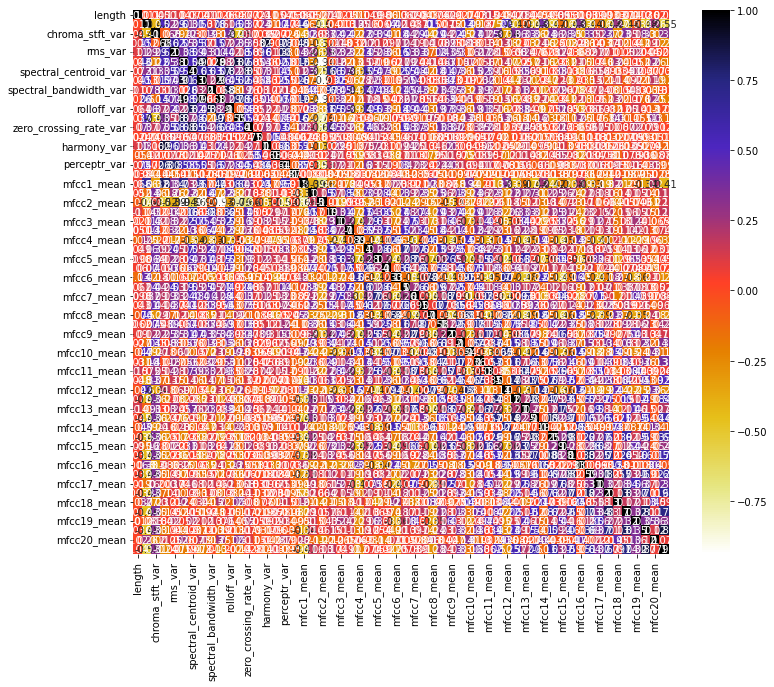

In [ ]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [ ]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
corr_features = correlation(X_train, 0.7)
len(set(corr_features))

30

In [ ]:
corr_features

{'harmony_var',
 'mfcc10_mean',
 'mfcc10_var',
 'mfcc11_mean',
 'mfcc11_var',
 'mfcc12_mean',
 'mfcc12_var',
 'mfcc13_mean',
 'mfcc13_var',
 'mfcc14_mean',
 'mfcc14_var',
 'mfcc15_mean',
 'mfcc15_var',
 'mfcc16_var',
 'mfcc17_var',
 'mfcc18_var',
 'mfcc19_var',
 'mfcc1_mean',
 'mfcc20_var',
 'mfcc2_mean',
 'mfcc6_var',
 'mfcc7_mean',
 'mfcc8_mean',
 'mfcc9_mean',
 'perceptr_var',
 'rolloff_mean',
 'rolloff_var',
 'spectral_bandwidth_mean',
 'zero_crossing_rate_mean',
 'zero_crossing_rate_var'}

In [ ]:
# This data will be used for mutual and chi2 feature selection

X_train_1 = X_train.drop(corr_features,axis=1)
X_test_1 =X_test.drop(corr_features,axis=1)

In [ ]:
X_train_1.head(), X_train_1.shape

(     length  chroma_stft_mean  ...  mfcc19_mean  mfcc20_mean
 0  0.047185          0.220475  ...     0.255698     0.167242
 1  0.047185          0.188433  ...     0.501112     0.465340
 2  0.047185          0.726479  ...     0.458337     0.668138
 3  0.047185          0.126546  ...     0.370952     0.356627
 4  0.047185          0.534238  ...     0.547257     0.540346
 
 [5 rows x 28 columns], (800, 28))

In [ ]:
X_test_1.shape

(200, 28)

### Feature selection

#### using mutual information

* Mutual Information measures the entropy drops under the condition of the target value.
* The MI score will fall in the range from 0 to 1. The higher value, the closer connection between this feature and the target, suggests that we should put this feature in the training dataset. If the MI score is 0 or very low like 0.01. the low score suggests a weak connection between this feature and the target.

In [ ]:
from sklearn.feature_selection import mutual_info_classif

mutual_info = mutual_info_classif(X_train_1, y_train)
mutual_info

array([0.39020182, 0.53051046, 0.30133868, 0.37282135, 0.37028849,
       0.4257089 , 0.41719623, 0.24319278, 0.20853568, 0.3252758 ,
       0.1695079 , 0.22969941, 0.15159146, 0.21843766, 0.17205527,
       0.307799  , 0.27421913, 0.25512158, 0.25588496, 0.29286634,
       0.23141511, 0.22543653, 0.13806426, 0.09028615, 0.23520631,
       0.08274389, 0.10066638, 0.10863177])

In [ ]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train_1.columns
mutual_info.sort_values(ascending=False)

chroma_stft_mean          0.530510
spectral_centroid_mean    0.425709
spectral_centroid_var     0.417196
length                    0.390202
rms_mean                  0.372821
rms_var                   0.370288
perceptr_mean             0.325276
mfcc4_mean                0.307799
chroma_stft_var           0.301339
mfcc6_mean                0.292866
mfcc4_var                 0.274219
mfcc5_var                 0.255885
mfcc5_mean                0.255122
spectral_bandwidth_var    0.243193
mfcc17_mean               0.235206
mfcc7_var                 0.231415
mfcc1_var                 0.229699
mfcc8_var                 0.225437
mfcc3_mean                0.218438
harmony_mean              0.208536
mfcc3_var                 0.172055
tempo                     0.169508
mfcc2_var                 0.151591
mfcc9_var                 0.138064
mfcc20_mean               0.108632
mfcc19_mean               0.100666
mfcc16_mean               0.090286
mfcc18_mean               0.082744
dtype: float64

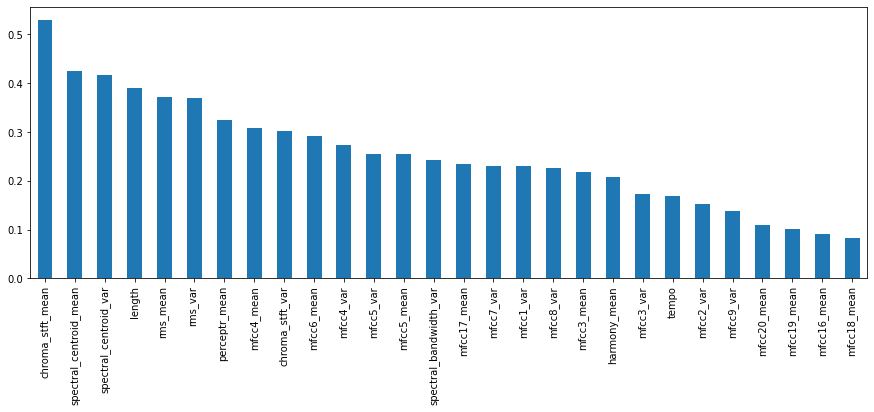

In [ ]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15,5))

In [ ]:
from sklearn.feature_selection import SelectKBest

In [ ]:
## Selecting the top 11 features(columns)
selected_top_columns = SelectKBest(mutual_info_classif, k=11)
selected_top_columns.fit(X_train_1, y_train)


SelectKBest(k=11, score_func=<function mutual_info_classif at 0x7f0faedcd290>)

In [ ]:
selected_top_columns.get_support()   ## shows which colums are selected

array([ True,  True,  True,  True,  True,  True,  True, False, False,
        True, False, False, False, False, False,  True,  True, False,
       False,  True, False, False, False, False, False, False, False,
       False])

In [ ]:
X_train_mi= X_train_1.columns[selected_top_columns.get_support()]
X_train_mi

Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var', 'perceptr_mean',
       'mfcc4_mean', 'mfcc4_var', 'mfcc6_mean'],
      dtype='object')

In [ ]:
X_test_mi = X_test_1.columns[selected_top_columns.get_support()]
X_test_mi

Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var', 'perceptr_mean',
       'mfcc4_mean', 'mfcc4_var', 'mfcc6_mean'],
      dtype='object')

In [ ]:
## Making a dataset of 11 best features

X_train_mi = X_train_1[['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var', 'perceptr_mean',
       'mfcc4_mean', 'mfcc4_var', 'mfcc6_mean']]

X_train_mi.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,perceptr_mean,mfcc4_mean,mfcc4_var,mfcc6_mean
0,0.047185,0.220475,0.958524,0.304204,0.173361,0.279104,0.232568,0.636682,0.346029,0.211117,0.691258
1,0.047185,0.188433,0.698074,0.219546,0.043903,0.070900,0.014339,0.549880,0.645789,0.221843,0.376410
2,0.047185,0.726479,0.346493,0.458803,0.136059,0.485415,0.082283,0.631559,0.570719,0.097029,0.748585
3,0.047185,0.126546,0.742382,0.185536,0.081928,0.209170,0.052962,0.583267,0.421032,0.121900,0.239158
4,0.047185,0.534238,0.758397,0.190243,0.114054,0.321047,0.213458,0.635373,0.595589,0.182989,0.792846


In [ ]:
X_test_mi = X_test_1[['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var', 'perceptr_mean',
       'mfcc4_mean', 'mfcc4_var', 'mfcc6_mean']]

X_test_mi.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,perceptr_mean,mfcc4_mean,mfcc4_var,mfcc6_mean
0,0.047185,0.530290,0.648660,0.108737,0.014257,0.606689,0.151234,0.664463,0.677543,0.038236,0.640227
1,0.027468,0.569168,0.619337,0.600230,0.289870,0.690306,0.207120,0.537285,0.193228,0.246734,0.400720
2,0.027468,0.244689,0.624570,0.494151,0.202975,0.360135,0.083659,0.651513,0.302340,0.110388,0.222117
3,0.047185,0.749188,0.191401,0.306812,0.022359,0.451536,0.035438,0.546592,0.744409,0.013898,0.723810
4,0.047185,0.553279,0.618448,0.505471,0.237961,0.394644,0.139456,0.534572,0.643505,0.281983,0.619087


In [ ]:
# https://medium.com/@hertan06/which-features-to-use-in-your-model-350630a1e31c

#### using chi sqaure

* A chi-square test is used in statistics to test the independence of two events. Given the data of two variables, we can get observed count O and expected count E. Chi-Square measures how expected count E and observed count O deviates each other.


In [ ]:
from sklearn.feature_selection import chi2

In [ ]:
# feature selection
def select_features(X_train_1, y_train, X_test_1):
	fs = SelectKBest(score_func=chi2, k='all')
	fs.fit(X_train_1, y_train)
	X_train_fs = fs.transform(X_train_1)
	X_test_fs = fs.transform(X_test_1)
	return X_train_fs, X_test_fs, fs

Feature 0: 13.174905
Feature 1: 32.292974
Feature 2: 6.864391
Feature 3: 30.974095
Feature 4: 51.623578
Feature 5: 33.161360
Feature 6: 41.847757
Feature 7: 19.302029
Feature 8: 0.048191
Feature 9: 0.710204
Feature 10: 3.091304
Feature 11: 9.899340
Feature 12: 10.091385
Feature 13: 8.732977
Feature 14: 9.920518
Feature 15: 26.333361
Feature 16: 23.710904
Feature 17: 11.371133
Feature 18: 18.349007
Feature 19: 22.183854
Feature 20: 27.135050
Feature 21: 13.036545
Feature 22: 12.101577
Feature 23: 4.967427
Feature 24: 14.233565
Feature 25: 4.094917
Feature 26: 4.014066
Feature 27: 2.190048


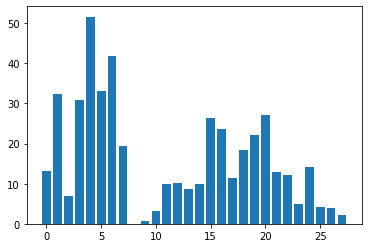

In [ ]:
# feature selection
X_train_fs, X_test_fs, fs = select_features(abs(X_train_1), y_train, X_test_1)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [ ]:
## Selecting the top 11 features(columns)
selected_top_columns = SelectKBest(chi2, k=11)
selected_top_columns.fit(abs(X_train_1), y_train)

SelectKBest(k=11, score_func=<function chi2 at 0x7f0faeddc440>)

In [ ]:
selected_top_columns.get_support()

array([False,  True, False,  True,  True,  True,  True,  True, False,
       False, False, False, False, False, False,  True,  True, False,
        True,  True,  True, False, False, False, False, False, False,
       False])

In [ ]:
X_train_chi2= X_train_1.columns[selected_top_columns.get_support()]
X_train_chi2

Index(['chroma_stft_mean', 'rms_mean', 'rms_var', 'spectral_centroid_mean',
       'spectral_centroid_var', 'spectral_bandwidth_var', 'mfcc4_mean',
       'mfcc4_var', 'mfcc5_var', 'mfcc6_mean', 'mfcc7_var'],
      dtype='object')

In [ ]:
X_train_chi2 = X_train_1[['chroma_stft_mean', 'rms_mean', 'rms_var', 'spectral_centroid_mean',
       'spectral_centroid_var', 'spectral_bandwidth_var', 'mfcc4_mean',
       'mfcc4_var', 'mfcc5_var', 'mfcc6_mean', 'mfcc7_var']]

X_train_chi2.head()

,chroma_stft_mean,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_var,mfcc4_mean,mfcc4_var,mfcc5_var,mfcc6_mean,mfcc7_var
0,0.220475,0.304204,0.173361,0.279104,0.232568,0.255132,0.346029,0.211117,0.187554,0.691258,0.827335
1,0.188433,0.219546,0.043903,0.070900,0.014339,0.022693,0.645789,0.221843,0.058264,0.376410,0.112237
2,0.726479,0.458803,0.136059,0.485415,0.082283,0.065832,0.570719,0.097029,0.066705,0.748585,0.092100
3,0.126546,0.185536,0.081928,0.209170,0.052962,0.111277,0.421032,0.121900,0.069260,0.239158,0.067126
4,0.534238,0.190243,0.114054,0.321047,0.213458,0.250776,0.595589,0.182989,0.223196,0.792846,0.711658


In [ ]:
X_test_chi2 = X_test_1[['chroma_stft_mean', 'rms_mean', 'rms_var', 'spectral_centroid_mean',
       'spectral_centroid_var', 'spectral_bandwidth_var', 'mfcc4_mean',
       'mfcc4_var', 'mfcc5_var', 'mfcc6_mean', 'mfcc7_var']]

X_test_chi2.head()

,chroma_stft_mean,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_var,mfcc4_mean,mfcc4_var,mfcc5_var,mfcc6_mean,mfcc7_var
0,0.530290,0.108737,0.014257,0.606689,0.151234,0.065221,0.677543,0.038236,0.027498,0.640227,0.072443
1,0.569168,0.600230,0.289870,0.690306,0.207120,0.228599,0.193228,0.246734,0.084120,0.400720,0.169379
2,0.244689,0.494151,0.202975,0.360135,0.083659,0.246486,0.302340,0.110388,0.066338,0.222117,0.126895
3,0.749188,0.306812,0.022359,0.451536,0.035438,0.038462,0.744409,0.013898,0.025025,0.723810,0.022911
4,0.553279,0.505471,0.237961,0.394644,0.139456,0.146212,0.643505,0.281983,0.127858,0.619087,0.308766


### Applying PCA

In [ ]:
# Standardizing the features
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()


In [ ]:
X_train_pca = X_train      ## copying data into another variable for applying pca on it
X_test_pca = X_test


In [ ]:
X_train_pca.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
29,661794,0.280357,0.105621,0.124736,0.004812,1648.835169,712342.593798,2189.985865,185296.921351,3759.892114,4.161772e+06,0.052895,0.003247,-4.683093e-06,0.016766,5.643013e-07,0.001319,129.199219,-233.715103,3684.393555,101.199020,885.532898,17.650900,375.351288,23.740635,219.337753,2.079885,227.544449,25.938902,135.666855,-16.969044,338.927124,15.079571,113.664886,-22.277378,98.267494,4.385386,122.710533,-23.197580,167.472733,-6.036646,81.793709,-5.057098,80.938660,1.069037,99.926735,-5.778514,88.899109,-8.310135,84.208382,-11.384393,98.334000,-6.723499,96.627716,-10.013582,74.162971,-14.026128,77.931458
535,661794,0.264600,0.089984,0.091492,0.001231,844.084418,51342.065119,1104.420736,26308.920034,1608.486974,4.285867e+05,0.037726,0.000132,-1.879469e-03,0.007581,-9.742977e-04,0.000567,71.777344,-261.892670,2606.836914,182.538132,458.836365,-16.891697,651.583496,49.850098,228.625748,-1.205302,91.306686,6.324243,67.988594,6.012869,71.068626,-8.899389,55.681728,-10.305132,56.869720,-3.210123,61.028271,-5.358582,52.871265,-3.550689,33.171692,-2.893337,39.031837,-7.469997,38.549366,-0.540485,29.001310,1.125303,43.192551,-1.974342,35.841900,-5.219293,65.051285,-1.866610,42.781399,-3.503479,53.901234
695,661794,0.529182,0.068875,0.185447,0.003780,2446.267671,257141.784822,2331.010128,55816.095450,5192.807708,8.364536e+05,0.121117,0.002386,7.354311e-07,0.014265,-5.696817e-05,0.010774,151.999081,-35.435493,1274.444214,94.095856,321.077667,-24.216127,197.812790,43.311424,120.537292,-16.380199,100.201012,29.510290,74.774506,-5.861135,63.525826,28.444475,48.874123,-13.959360,49.741516,13.743106,46.696556,-9.195683,42.256046,15.589109,32.880859,-8.493427,33.706356,11.399914,39.456825,-6.129584,36.500557,9.323952,32.028889,-6.608163,33.616463,3.498461,48.407642,-3.286584,37.829609,3.655154,31.723753
557,661794,0.234168,0.092644,0.078136,0.002283,1378.524274,168329.629531,1773.676404,86900.504631,2584.908654,8.896191e+05,0.061859,0.001325,-4.338201e-03,0.007560,-5.993299e-04,0.000214,95.703125,-248.030884,3241.810791,125.956253,401.456726,-12.608919,496.919769,30.273462,142.075806,-1.075209,102.893852,-2.226388,80.347870,1.928532,54.170994,0.229403,52.057205,2.700755,74.953621,-4.399659,57.814011,-6.444574,95.746140,-6.496408,53.562397,-3.991488,70.001930,2.322678,57.442112,0.349836,60.768044,-4.048587,49.173058,-1.498452,73.097794,-3.520071,94.470222,-6.187496,113.834229,-7.340963,90.994820
836,661794,0.434649,0.093606,0.079984,0.003172,1810.952863,654461.458880,2166.280664,182317.147014,4118.229261,2.871598e+06,0.059205,0.002021,1.487772e-06,0.003826,-1.413094e-05,0.003327,86.132812,-236.647095,5501.917480,91.687912,704.675293,1.882287,606.587219,45.477638,194.978394,1.278727,265.102112,32.267735,228.139160,9.049938,295.597198,19.613438,198.178436,-5.055937,111.908035,10.965200,159.125748,-4.000939,89.309006,7.524836,102.187187,-0.336928,112.294495,5.805341,76.561066,-1.821287,77.442513,5.381378,69.861420,0.286342,82.497223,5.014830,57.189030,-0.334739,74.218369,-0.855825,63.519684


In [ ]:
cols1 = X_train_pca.columns
cols = X_test_pca.columns
cols

Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var'],
      dtype='

In [ ]:
cols.shape

(58,)

In [ ]:
np_scaled1 = scaler.fit_transform(X_train_pca)      ## Standardization of data
np_scaled = scaler.transform(X_test_pca)

In [ ]:
X_train_pca = pd.DataFrame(np_scaled1, columns=cols1)
X_test_pca = pd.DataFrame(np_scaled, columns=cols)

In [ ]:
X_train_pca.describe()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02,8.000000e+02
mean,-2.150967e-14,-2.517431e-16,2.731149e-16,1.754152e-16,-2.137179e-17,-2.858824e-16,1.321165e-16,6.106227e-17,2.103873e-16,2.578493e-16,1.215694e-16,-3.007317e-16,-1.013079e-17,-1.141448e-17,-1.013079e-17,3.365364e-17,6.314393e-17,-4.145295e-16,-6.966649e-17,5.107026e-17,4.218847e-17,-7.660539e-17,-1.165734e-17,8.049117e-17,-4.593548e-17,5.689893e-17,-1.221245e-17,7.716050e-17,1.582068e-17,-9.534040e-17,-3.913536e-17,-1.929013e-17,7.091550e-17,1.582068e-17,-1.609823e-17,9.242607e-17,2.678413e-17,1.659783e-16,-5.162537e-17,-1.386391e-16,3.330669e-17,1.095998e-16,3.427814e-17,-1.545986e-16,3.580469e-17,-5.509482e-17,-3.552714e-17,-4.302114e-17,-2.858824e-17,-5.190293e-17,8.146261e-17,-9.089951e-17,6.800116e-18,8.118506e-18,-5.516421e-17,-5.707240e-17,2.338407e-17,1.242062e-17
std,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00,1.000626e+00
min,-5.344893e-01,-2.534904e+00,-5.159560e+00,-1.893503e+00,-8.245141e-01,-2.231093e+00,-1.138660e+00,-2.462590e+00,-1.307268e+00,-2.351558e+00,-1.281348e+00,-1.959151e+00,-9.620315e-01,-1.600560e+01,-1.071077e+00,-6.401257e+00,-8.561620e-01,-2.132581e+00,-3.960031e+00,-1.321279e+00,-3.160233e+00,-1.398670e+00,-3.699725e+00,-1.441950e+00,-2.526817e+00,-1.603900e+00,-3.132679e+00,-1.429246e+00,-2.670005e+00,-1.575277e+00,-2.797179e+00,-1.509914e+00,-2.871600e+00,-1.613722e+00,-2.969129e+00,-1.598405e+00,-2.442964e+00,-1.694870e+00,-3.217523e+00,-1.376457e+00,-2.616558e+00,-1.481091e+00,-3.004634e+00,-1.492858e+00,-2.852308e+00,-1.552307e+00,-2.817343e+00,-1.611984e+00,-3.759001e+00,-1.654005e+00,-2.992681e+00,-1.488037e+00,-3.125912e+00,-1.424981e+00,-4.270339e+00,-1.453688e+00,-4.973856e+00,-1.404033e+00
25%,-3.006626e-01,-7.136680e-01,-5.469811e-01,-6.642553e-01,-5.738328e-01,-8.116440e-01,-7.140622e-01,-6.572874e-01,-7.200329e-01,-7.894575e-01,-7.478756e-0

In [ ]:
from sklearn.decomposition import PCA

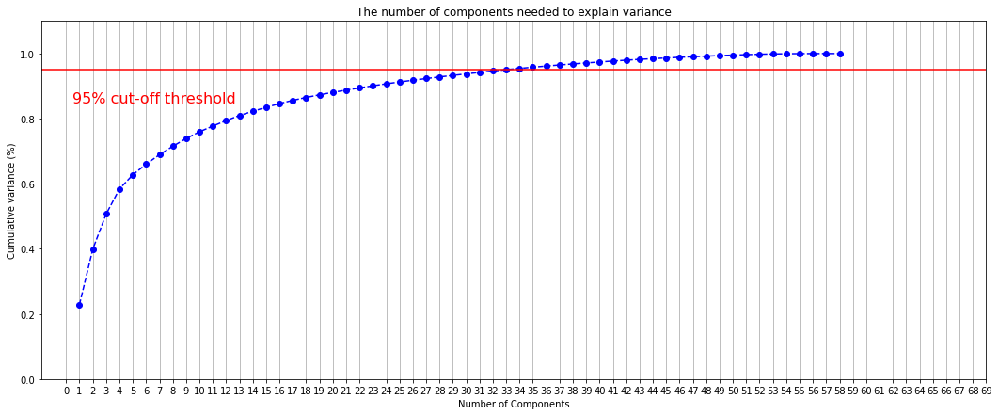

In [ ]:
## PCA
## finding n_components

pca = PCA().fit(X_train_pca)

% matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (18,7)

fig, ax = plt.subplots()
xi = np.arange(1, 59, step=1)
y = np.cumsum(pca.explained_variance_ratio_)   ## cumsum (cummulative sum of explined_varince_ratio)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 70, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
y

array([0.22870314, 0.39908803, 0.50686503, 0.58411466, 0.62744965,
       0.66023969, 0.68925075, 0.7151504 , 0.73899403, 0.75972761,
       0.777198  , 0.79409825, 0.80973514, 0.82256945, 0.83467754,
       0.84626834, 0.85618842, 0.86504331, 0.87319621, 0.88056488,
       0.88755183, 0.89432227, 0.90083692, 0.90685399, 0.91257297,
       0.91792975, 0.92304728, 0.92807906, 0.93280575, 0.93740209,
       0.94188522, 0.94619089, 0.95036292, 0.95427582, 0.95794353,
       0.96144439, 0.96483617, 0.96799303, 0.97102186, 0.97396596,
       0.97682489, 0.97951868, 0.98205881, 0.98423076, 0.98632057,
       0.98831976, 0.99022775, 0.99198844, 0.9936715 , 0.99514778,
       0.99660929, 0.9978679 , 0.99874002, 0.99935227, 0.99974538,
       0.99988012, 0.99996627, 1.        ])

In [ ]:
X_train_pca.shape

(800, 58)

In [ ]:
## Applying pca

pca = PCA(n_components=32)
X_train_pca = pca.fit_transform(X_train_pca)
X_test_pca = pca.transform(X_test_pca)


In [ ]:
X_train_pca.shape


(800, 32)

In [ ]:
cols = X_train_pca.shape[1]
cols

32

In [ ]:
X_train_pca.shape

(800, 32)

In [ ]:
X_train_pca = pd.DataFrame(X_train_pca )    ## converting pca into dataframe
X_test_pca = pd.DataFrame(X_test_pca )

In [ ]:
X_test_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,-5.492233,0.756867,1.568859,1.617302,-0.055537,-2.654416,-0.390596,-1.543029,-1.376101,0.308309,0.441407,0.965291,-0.029255,0.897479,-1.575754,0.650715,-1.465299,-0.594826,-0.563972,-0.231450,0.357411,-0.026169,-0.613036,0.299844,0.552486,-0.016159,0.389323,0.225807,0.435761,0.116136,-0.478518,-0.148925
1,1.824219,4.751488,-1.250063,1.068642,-0.401261,1.181250,0.999623,0.522618,1.222808,-0.203296,-0.717475,0.485247,-0.848276,0.217293,0.103817,0.548982,1.022887,0.953970,-0.608284,-0.415631,0.556445,-0.999412,-0.515739,0.742522,0.020852,-0.292943,-0.500476,0.393334,0.004053,-0.487944,0.439357,-0.410072
2,1.648033,-0.108101,-2.648294,2.326773,0.394746,2.035892,-0.110099,-0.011415,-0.272578,0.950616,-0.319034,-0.445176,-0.747909,-0.167747,0.187415,-0.086279,0.561284,0.316729,-0.558100,0.427174,-0.005724,0.524314,-0.271474,-0.398281,0.491900,-0.084808,0.527772,-0.023941,-0.381651,1.764763,-0.198202,-0.091172
3,-7.802535,0.896485,-0.166104,0.393039,0.025814,-0.480878,0.684187,-1.364102,0.528845,0.338409,-0.814127,0.927650,0.092007,-1.006476,1.385037,-0.002137,0.720670,-0.929878,0.844534,-0.045096,-0.023361,-0.337511,0.244203,0.319639,-0.243327,0.437868,-0.175816,0.469986,-0.312650,0.244665,-0.207991,-0.119503
4,-1.624264,0.485889,3.376699,0.067018,-0.935462,1.342696,-2.162809,-0.707024,-0.294327,0.594462,0.303087,-0.842575,-0.529826,-0.743137,-0.235957,1.519726,0.393724,-0.041438,0.207006,0.458162,0.530103,-0.517660,0.674218,-0.110389,-0.918333,-0.020298,-0.576795,-0.502198,0.180708,-0.049809,0.134887,0.323893


In [ ]:
pca = PCA(n_components=2)
X_train_try = pca.fit_transform(X_train_try)
X_test_try = pca.transform(X_test_try)

In [ ]:
X_train_try = pd.DataFrame(X_train_pca )
X_test_try = pd.DataFrame(X_test_pca )

## Model Building

https://www.kaggle.com/andradaolteanu/work-w-audio-data-visualise-classify-recommend

In [ ]:
pip install catboost

     |████████████████████████████████| 76.4 MB 38 kB/s 


In [ ]:
## Importing neccesary libraries for modeling.

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, classification_report
import catboost as cb

### Model for Normalize data ( the main dataset)

In [ ]:
## defining a function for modeling

def model_assess(model, title = "Default"):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    #print(confusion_matrix(y_test, preds))
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
    print(classification_report(y_test, preds))


In [ ]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess(cbc,"Cat Boost Classifier")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Naive Bayes : 0.5 

              precision    recall  f1-score   support

           0       0.25      0.65      0.36        20
           1       0.92      0.92      0.92        13
           2       0.64      0.26      0.37        27
           3       0.59      0.48      0.53        21
           4       0.53      0.60      0.56        15
           5       0.67      0.27      0.39        22
           6       0.52      0.96      0.68        25
           7       0.82      0.69      0.75        13
           8       0.50      0.26      0.34        23
           9       0.36      0.19      0.25        21

    accuracy                           0.50       200
   macro avg       0.58      0.53      0.51       200
weighted avg       0.56      0.50      0.48       200

Accuracy Stochastic Gradient Descent : 0.555 

              precision    recall  f1-score   support

           0       1.00      0.25      0.40        20
           1       1.00      0.92      0.96        13
  

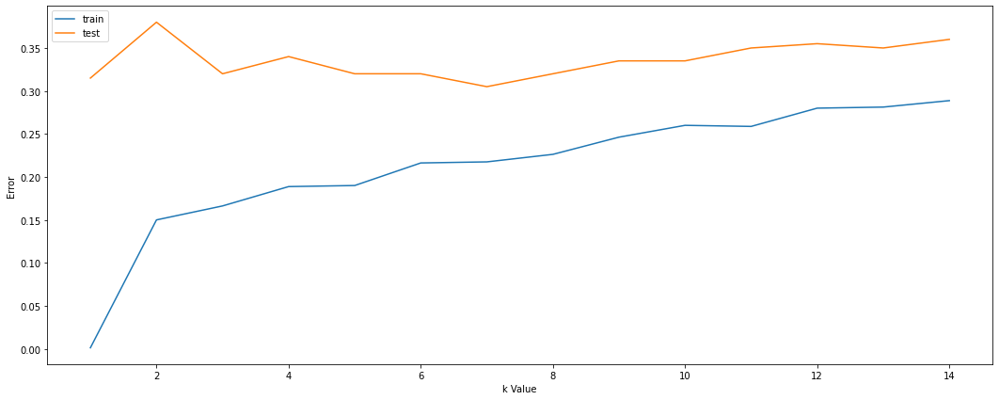

In [ ]:
## KNN

#finding the K

error1= []
error2= []
for k in range(1,15):
    knn= KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    y_pred1= knn.predict(X_train)
    error1.append(np.mean(y_train!= y_pred1))
    y_pred2= knn.predict(X_test)
    error2.append(np.mean(y_test!= y_pred2))
# plt.figure(figsize(10,5))
plt.plot(range(1,15),error1,label="train")
plt.plot(range(1,15),error2,label="test")
plt.xlabel('k Value')
plt.ylabel('Error')
plt.legend()


In [ ]:
## Applied the KNN

knn= KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)
y_pred= knn.predict(X_test)
accuracy_score(y_test, y_pred)


0.695

In [ ]:
print(classification_report(y_test, y_pred))    ## classification report

              precision    recall  f1-score   support

           0       0.82      0.70      0.76        20
           1       0.80      0.92      0.86        13
           2       0.50      0.70      0.58        27
           3       0.55      0.76      0.64        21
           4       0.65      0.73      0.69        15
           5       0.89      0.73      0.80        22
           6       0.88      0.84      0.86        25
           7       0.82      0.69      0.75        13
           8       0.60      0.39      0.47        23
           9       0.75      0.57      0.65        21

    accuracy                           0.69       200
   macro avg       0.73      0.70      0.71       200
weighted avg       0.72      0.69      0.70       200



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


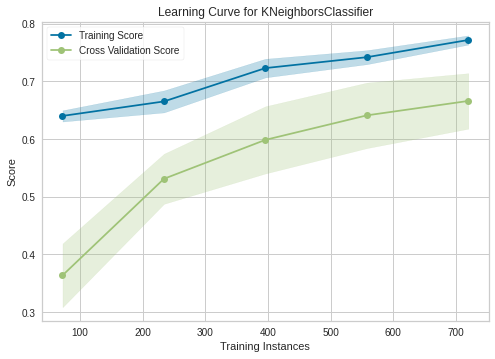

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
from yellowbrick.model_selection import learning_curve
print(learning_curve(knn, X_train, y_train, cv=10, scoring='accuracy'))

In [ ]:
## implemantaion of svm
model = SVC()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.635

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.45      0.45      0.45        20
           1       0.92      0.92      0.92        13
           2       0.76      0.59      0.67        27
           3       0.52      0.62      0.57        21
           4       0.61      0.73      0.67        15
           5       0.79      0.86      0.83        22
           6       0.72      0.92      0.81        25
           7       0.75      0.69      0.72        13
           8       0.60      0.39      0.47        23
           9       0.30      0.29      0.29        21

    accuracy                           0.64       200
   macro avg       0.64      0.65      0.64       200
weighted avg       0.63      0.64      0.63       200



In [ ]:
## Now hypertunning the SVM


from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.481, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.519, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.506, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.494, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.306, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.281, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.263, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.369, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.294, total=   0.1s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV] .

[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:   10.7s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
# print best parameter after tuning
print(grid.best_params_)

# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 100, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='rbf', max_iter=-1,
    probability=False, random_state=None, shrinking=True, tol=0.001,
    verbose=False)


In [ ]:
grid_predictions = grid.predict(X_test)

# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

           0       0.76      0.80      0.78        20
           1       0.92      0.92      0.92        13
           2       0.83      0.70      0.76        27
           3       0.85      0.81      0.83        21
           4       0.52      0.93      0.67        15
           5       0.83      0.86      0.84        22
           6       0.96      0.88      0.92        25
           7       0.64      0.69      0.67        13
           8       0.67      0.35      0.46        23
           9       0.67      0.76      0.71        21

    accuracy                           0.76       200
   macro avg       0.76      0.77      0.76       200
weighted avg       0.77      0.76      0.76       200



In [ ]:
## Random Forest

rf = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test, y_pred)

0.765

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


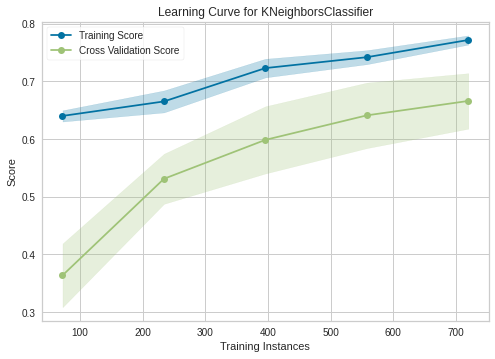

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
print(learning_curve(knn, X_train, y_train, cv=10, scoring='accuracy'))

In [ ]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid.fit(X_train, y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 10.2min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
# print best parameter after tuning
print(grid.best_params_)

{'bootstrap': True, 'max_depth': 100, 'max_features': 3, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 1000}


In [ ]:
## Random Forest

rf = RandomForestClassifier(n_estimators=1500, max_depth=90,
                             max_features=6,  min_samples_split=8)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test, y_pred)

0.76

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


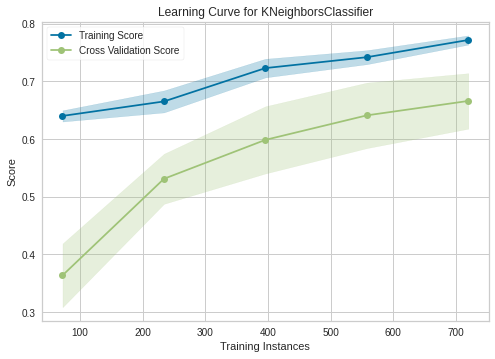

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
print(learning_curve(knn, X_train, y_train, cv=10, scoring='accuracy'))

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.80      0.70        20
           1       1.00      1.00      1.00        13
           2       0.80      0.59      0.68        27
           3       0.78      0.67      0.72        21
           4       0.60      0.80      0.69        15
           5       0.91      0.95      0.93        22
           6       0.86      0.96      0.91        25
           7       0.83      0.77      0.80        13
           8       0.70      0.61      0.65        23
           9       0.60      0.57      0.59        21

    accuracy                           0.76       200
   macro avg       0.77      0.77      0.77       200
weighted avg       0.77      0.76      0.76       200



In [ ]:
## XGBOOST
# define the model
xgb = XGBClassifier(n_estimators=1500, learning_rate=0.05, eta=0.5)
# define the datasets to evaluate each iteration
evalset = [(X_train, y_train), (X_test,y_test)]
# fit the model
xgb.fit(X_train, y_train, eval_metric='logloss')
# evaluate performance
yhat = model.predict(X_test)
score = accuracy_score(y_test, yhat)
print('Accuracy: %.3f' % score)


Accuracy: 0.635


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


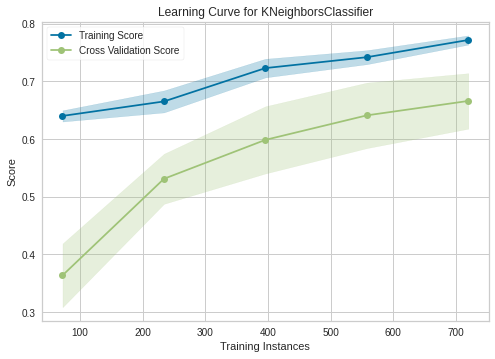

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
print(learning_curve(knn, X_train, y_train, cv=10, scoring='accuracy'))

### PCA applied dataset for modeling

In [ ]:
def model_assess(model, title = "Default"):
    model.fit(X_train_pca, y_train)
    preds = model.predict(X_test_pca)
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
    print(classification_report(y_test, preds))

In [ ]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess(cbc,"Cat Boost Classifier")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Naive Bayes : 0.575 

              precision    recall  f1-score   support

           0       0.56      0.50      0.53        20
           1       0.72      1.00      0.84        13
           2       0.68      0.63      0.65        27
           3       0.43      0.48      0.45        21
           4       0.53      0.60      0.56        15
           5       0.64      0.41      0.50        22
           6       0.67      0.88      0.76        25
           7       0.55      0.46      0.50        13
           8       0.59      0.43      0.50        23
           9       0.38      0.43      0.40        21

    accuracy                           0.57       200
   macro avg       0.57      0.58      0.57       200
weighted avg       0.58      0.57      0.57       200

Accuracy Stochastic Gradient Descent : 0.595 

              precision    recall  f1-score   support

           0       0.39      0.45      0.42        20
           1       1.00      0.85      0.92        13


### From mutual information Dataset

In [ ]:
def model_assess_mi(model, title = "Default"):
    model.fit(X_train_mi, y_train)
    preds = model.predict(X_test_mi)
    #print(confusion_matrix(y_test, preds))
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
    print(classification_report(y_test, preds))

In [ ]:
# Naive Bayes
nb = GaussianNB()
model_assess_mi(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess_mi(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess_mi(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess_mi(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess_mi(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess_mi(svm, "Support Vector Machine")


# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess_mi(cbc,"Cat Boost Classifier")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess_mi(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess_mi(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Naive Bayes : 0.39 

              precision    recall  f1-score   support

           0       0.19      1.00      0.31        20
           1       1.00      0.69      0.82        13
           2       0.00      0.00      0.00        27
           3       0.71      0.24      0.36        21
           4       0.67      0.40      0.50        15
           5       1.00      0.05      0.09        22
           6       0.81      0.84      0.82        25
           7       0.57      1.00      0.72        13
           8       0.27      0.13      0.18        23
           9       0.00      0.00      0.00        21

    accuracy                           0.39       200
   macro avg       0.52      0.43      0.38       200
weighted avg       0.49      0.39      0.34       200

Accuracy Stochastic Gradient Descent : 0.515 

              precision    recall  f1-score   support

           0       0.32      0.60      0.42        20
           1       0.72      1.00      0.84        13
 

In [ ]:
## Random Forest

rf = RandomForestClassifier(n_estimators=1500, max_depth=90,
                             max_features=6,  min_samples_split=8)
rf.fit(X_train_mi, y_train)
y_pred = rf.predict(X_test_mi)
accuracy_score(y_test, y_pred)

0.68

In [ ]:
# Create the parameter grid based on the results of random search
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid,
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid.fit(X_train_mi, y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 644 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed: 10.0min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
print(grid.best_params_)

{'bootstrap': True, 'max_depth': 110, 'max_features': 3, 'min_samples_leaf': 3, 'min_samples_split': 8, 'n_estimators': 1000}


In [ ]:
## Random Forest

rf = RandomForestClassifier(n_estimators=1000, max_depth=110, min_samples_leaf= 3,
                             max_features=3,  min_samples_split=8)
rf.fit(X_train_mi, y_train)
y_pred = rf.predict(X_test_mi)
accuracy_score(y_test, y_pred)

0.695

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


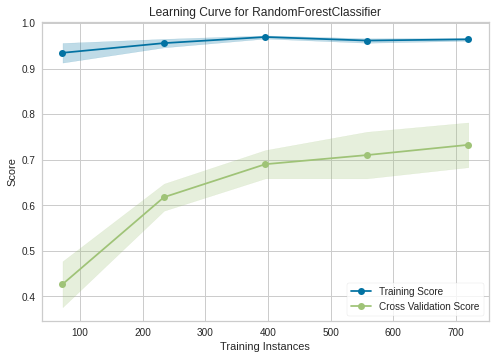

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
print(learning_curve(rf, X_train_mi, y_train, cv=10, scoring='accuracy'))

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


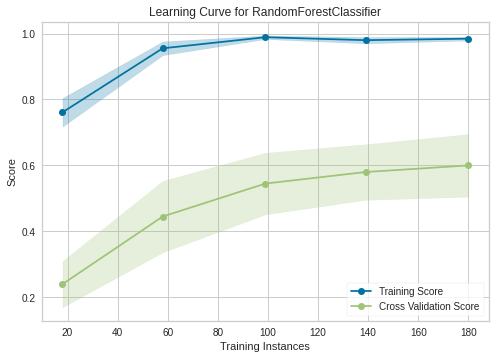

AxesSubplot(0.125,0.125;0.775x0.755)


In [ ]:
print(learning_curve(rf, X_test_mi, y_test, cv=10, scoring='accuracy'))

### From chi2 Dataset

In [ ]:
def model_assess_ch(model, title = "Default"):
    model.fit(X_train_chi2, y_train)
    preds = model.predict(X_test_chi2)
    #print(confusion_matrix(y_test, preds))
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')
    print(classification_report(y_test, preds))

In [ ]:
# Naive Bayes
nb = GaussianNB()
model_assess_ch(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess_ch(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess_ch(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess_ch(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess_ch(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess_ch(svm, "Support Vector Machine")


# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess_ch(cbc,"Cat Boost Classifier")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess_ch(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess_ch(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Naive Bayes : 0.485 

              precision    recall  f1-score   support

           0       0.35      0.35      0.35        20
           1       0.75      0.92      0.83        13
           2       0.43      0.37      0.40        27
           3       0.41      0.43      0.42        21
           4       0.56      0.33      0.42        15
           5       0.71      0.55      0.62        22
           6       0.51      0.92      0.66        25
           7       0.67      0.62      0.64        13
           8       0.33      0.35      0.34        23
           9       0.25      0.14      0.18        21

    accuracy                           0.48       200
   macro avg       0.50      0.50      0.48       200
weighted avg       0.48      0.48      0.47       200

Accuracy Stochastic Gradient Descent : 0.505 

              precision    recall  f1-score   support

           0       0.37      0.50      0.43        20
           1       0.65      1.00      0.79        13
